In [83]:
import requests
import json
import pandas as pd
import geopandas as gpd
import os
import re
import plotly.express as px
from collections import defaultdict
from geojson import Feature, FeatureCollection
from thefuzz import fuzz, process
from shapely.geometry import mapping, shape, Polygon
from shapely import wkt

In [84]:
pd.set_option('display.max_rows', 500)

In [177]:
STATE_GEO_VALUES = {
    "Baden-Württemberg": (48.6, 9.1, 6.85),
    "Bayern": (48.90, 11.45, 6.3),
    "Brandenburg": (52.45, 13.1, 6.8),
    "Bremen": (53.3, 8.6, 8.6),
    "Hamburg": (53.55, 10, 9),
    "Hessen": (50.6521, 9.1624, 6.7),
    "Mecklenburg-Vorpommern": (53.8, 12.43, 7),
    "Niedersachsen": (52.64, 9.85, 7),
    "Nordrhein-Westfalen": (51.4332, 7.6616, 6.8),
    "Rheinland-Pfalz": (49.8, 7.3, 7.0),
    "Saarland": (49.3964, 6.9, 8.3),
    "Sachsen": (50.9, 13.34, 6.9),
    "Sachsen-Anhalt": (51.95, 11.69, 7),
    "Schleswig-Holstein": (54.15, 9.8, 6.8),
    "Thüringen": (50.8, 11.25, 7.3),
    "(Deutschland)": (51.1657, 10.4515, 5)
}

In [86]:
def fuzzy_search(data_df, difference_set, threshold):
    for e in difference_set:
        # Extract unique districts from data_df
        unique_districts = data_df['district'].unique()
        
        # Get top matches (max. 10)
        top_matches = process.extract(e, unique_districts, limit=10)
        
        print("----------------------------------------------------------")
        
        # Filter with threshold
        valid_matches = [match for match, score in top_matches if score >= threshold]
        
        # Render results
        if valid_matches:
            print(f"Geo: {e}")
            data_str = 'Data: ' + ' '.join([f"{i+1}. {match}" for i, match in enumerate(valid_matches)])
            print(data_str)
        else:
            print(f"Kein match für: {e}")
    

In [87]:
def set_geographical_values(selected_state):
    return STATE_GEO_VALUES.get(selected_state, STATE_GEO_VALUES['(Deutschland)'])

def create_state_map(state_df, selected_state, selected_building_type, selected_heat_source):
    lat, lon, zoom = set_geographical_values(selected_state)
    
    filtered_df = state_df.query(f"building_type == {selected_building_type} & heat_source == {selected_heat_source} & federal_state == '{selected_state}'")
    
    geojson = {
    "type": "FeatureCollection",
    "features": [
        {
            "type": "Feature",
            "properties": {"district": row.district, "district_type": row.district_type},
            "geometry": mapping(row.geometry)
        }
        for idx, row in filtered_df.iterrows()
    ]
    }
    
    fig = px.choropleth_mapbox(filtered_df, 
                            geojson=geojson, 
                            locations='district',
                            featureidkey="properties.district",
                            color='value',
                            color_continuous_scale='RdYlGn',
                            range_color=[0, 1],
                            mapbox_style="carto-darkmatter",
                            opacity=1,
                            #hover_data={'value': True},
                            hover_name=filtered_df['district'],
                            hover_data={'value': True} 
                           )

    fig.update_traces(hovertemplate='%{hovertext}<br>%{z:.1%}')
    fig.update_geos(fitbounds="locations")
    fig.update_layout(
        mapbox_zoom=zoom,
        mapbox_center={"lat": lat, "lon": lon},
        autosize=False,
        width=800, 
        height=800,
        coloraxis_showscale=False
        )
    
    return fig

In [88]:
def remove_cities(data_df):
    return data_df[~data_df['district'].str.endswith(', Kreisfreie Stadt')]

In [89]:
BUILDING_TYPE_MAPPING = {
        1: 'One- and Two-family Houses',
        6: 'Apartment Buildings (3-6)',
        9: 'Row Houses',
        11: 'Semi-detached Houses',
        38: 'Apartment Buildings: 7 and More Apartments',
        100: 'Total'
    }

HEAT_SOURCE_MAPPING = {
        0: 'Total',
        1: 'Air',
        2: 'Ground Probe',
        3: 'Ground Collector',
        4: 'Solar-Thermal Energy and Ice Storage'
    }

In [90]:
DISTRICT_DATA_URL = "https://opendata.ffe.de/api/od/v_opendata?id_opendata=eq.88"
DISTRICT_GEOJSON_URL = "https://raw.githubusercontent.com/isellsoap/deutschlandGeoJSON/main/4_kreise/2_hoch.geo.json"

## Process raw data

In [91]:
# Fetch data from API
def fetch_data(url):
    response = requests.get(url)
    if response.status_code == 200:
        return json.loads(response.text)
    else:
        return None

In [92]:
raw_data_json = fetch_data(DISTRICT_DATA_URL)

In [93]:
raw_data_df = pd.DataFrame(raw_data_json[0]['data']).dropna(axis=1, how='all')

In [94]:
drop_cols = ['id_opendata', 'id_region_type', 'region_type', 'id_region', 'year', 'internal_id']
raw_data_df.drop(drop_cols, axis=1, inplace=True)

In [95]:
raw_data_df.rename(columns={'region': 'district', 'internal_id_1': 'building_type', 'internal_id_2': 'heat_source'}, inplace=True)

## Process raw geojson

In [96]:
raw_geojson = fetch_data(DISTRICT_GEOJSON_URL)

In [97]:
# Initialize a dictionary to hold the features grouped by NAME_1
geojson_by_name_1 = defaultdict(list)

# Iterate over all features in the raw GeoJSON and group them by NAME_1
for feature in raw_geojson['features']:
    name_1 = feature['properties']['NAME_1']
    geojson_by_name_1[name_1].append(feature)

# Create a separate GeoJSON file for each unique NAME_1
output_dir = 'output_geojsons'
os.makedirs(output_dir, exist_ok=True)

for name_1, features in geojson_by_name_1.items():
    feature_collection = FeatureCollection(features)
    output_file_path = os.path.join(output_dir, f"{name_1.replace(' ', '_')}.geojson")
    
    with open(output_file_path, 'w') as f:
        json.dump(feature_collection, f)

print(f"GeoJSON created in the {output_dir} directory.")


GeoJSON created in the output_geojsons directory.


In [98]:
gpd_drop_cols = ['ID_0', 'ISO', 'NAME_0', 'ID_1', 'ID_2', 'NAME_2', 'ID_3', 'NL_NAME_3', 'VARNAME_3', 'ENGTYPE_3']

-----------------------------------------

## Baden-Württemberg

In [99]:
bw_geojson = gpd.read_file('output_geojsons/Baden-Württemberg.geojson')

### Process Geopandas Dataframe for Baden-Württemberg

In [100]:
# Create function for geopandas processing
def process_gpd_geojson(raw_gpd):
    """
    Geojson has to be read in with Geopandas first (gpd.read_file('filepath.geojson'))
    """
    gpd_drop_cols = ['ID_0', 'ISO', 'NAME_0', 'ID_1', 'ID_2', 'NAME_2', 'ID_3', 'NL_NAME_3', 'VARNAME_3', 'ENGTYPE_3']
    raw_gpd.drop(gpd_drop_cols, axis=1, inplace=True)
    renamed_cols = {
        'NAME_1': 'federal_state',
        'NAME_3': 'district',
        'TYPE_3': 'district_type'
    }
    raw_gpd.rename(columns=renamed_cols, inplace=True)
    
    # Defining the regex pattern
    pattern = re.compile(r' Städte')
    # Apply regex substitution
    raw_gpd['district'] = raw_gpd['district'].apply(lambda x: re.sub(pattern, '', x))
    
    # Sort
    raw_gpd = raw_gpd.sort_values(by=['district_type', 'district']).reset_index(drop=True)
    
    clean_gpd = raw_gpd
    
    return clean_gpd

In [101]:
gpd_drop_cols = ['ID_0', 'ISO', 'NAME_0', 'ID_1', 'ID_2', 'NAME_2', 'ID_3', 'NL_NAME_3', 'VARNAME_3', 'ENGTYPE_3']

In [102]:
bw_geojson.drop(gpd_drop_cols, axis=1, inplace=True)

In [103]:
renamed_cols = {
    'NAME_1': 'federal_state',
    'NAME_3': 'district',
    'TYPE_3': 'district_type'
}
bw_geojson.rename(columns=renamed_cols, inplace=True)

In [104]:
# Defining the regex pattern
pattern = re.compile(r' Städte')

In [105]:
# Apply regex substitution
bw_geojson['district'] = bw_geojson['district'].apply(lambda x: re.sub(pattern, '', x))

In [106]:
# Fix Heilbronn
bw_geojson.loc[bw_geojson['district'] == 'Heilbronn city', 'district'] = 'Heilbronn'

In [107]:
# Fix Freiburg (Freiburg im Breisgau)
bw_geojson.loc[bw_geojson['district'] == 'Freiburg', 'district'] = 'Freiburg im Breisgau'

In [108]:
# Sort
bw_geojson = bw_geojson.sort_values(by=['district_type', 'district']).reset_index(drop=True)

----------------------

#### ---DONE--- 

In [109]:
bw_geojson

,federal_state,district,district_type,geometry
0,Baden-Württemberg,Baden-Baden,Kreisfreie Städte,"POLYGON ((8.19391 48.83635, 8.19588 48.83392, ..."
1,Baden-Württemberg,Freiburg im Breisgau,Kreisfreie Städte,"POLYGON ((7.84910 48.05642, 7.84930 48.05272, ..."
2,Baden-Württemberg,Heidelberg,Kreisfreie Städte,"POLYGON ((8.58292 49.43313, 8.59429 49.43354, ..."
3,Baden-Württemberg,Heilbronn,Kreisfreie Städte,"POLYGON ((9.16618 49.20699, 9.16658 49.19575, ..."
4,Baden-Württemberg,Karlsruhe,Kreisfreie Städte,"POLYGON ((8.34080 49.08401, 8.34661 49.08050, ..."
5,Baden-Württemberg,Mannheim,Kreisfreie Städte,"POLYGON ((8.42372 49.57440, 8.42944 49.57460, ..."
6,Baden-Württemberg,Pforzheim,Kreisfreie Städte,"POLYGON ((8.70279 48.83761, 8.68022 48.83721, ..."
7,Baden-Württemberg,Stuttgart,Kreisfreie Städte,"POLYGON ((9.31032 48.77663, 9.29910 48.77277, ..."
8,Baden-Württemberg,Ulm,Kreisfreie Städte,"POLYGON ((10.00016 48.35505, 9.99456 48.35495,..."
9,Baden-Württemberg,Alb-Donau,Landkreise,"POLYGON ((9.58700 48.53665, 9.59255 48.54044, ..."


In [110]:
bw_geojson['district_type'].value_counts()

district_type
Landkreise           35
Kreisfreie Städte     9
Name: count, dtype: int64

GEODATA HAS 44 VALUES -> 35 LANDKREISE + 9 STÄDTE, KORREKT

-------------------------

#### Create raw_data subset

In [111]:
# CREATE FUNCTION FOR FUZZY MATCH
def fuzzy_match(raw_data_df, geo_df):
    # Create copy for editing
    data_df = raw_data_df.copy()
    geo = geo_df.copy()
    
    # Initialize match values
    data_df['match'] = False
    
    # Do the fuzzy match
    for df_i, df_r in data_df.iterrows():
        for geo_i, geo_r in geo.iterrows():
            if fuzz.partial_ratio(df_r['district'], geo_r['district']) == 100:
                geo.at[df_i, 'match'] = True
                break
    
    matched_data_df = data_df
    
    return matched_data_df

In [112]:
# Create copy for editing
bw_df = raw_data_df.copy()

In [113]:
# Initialize match values
bw_df['match'] = False

In [114]:
# Do the fuzzy match
for df_i, df_r in bw_df.iterrows():
    for geo_i, geo_r in bw_geojson.iterrows():
        if fuzz.partial_ratio(df_r['district'], geo_r['district']) == 100:
            bw_df.at[df_i, 'match'] = True
            break

In [115]:
# Set up for comparison
BWDATA = pd.DataFrame(bw_df[bw_df['match'] == True]['district'].unique())
BWDATA = BWDATA.rename(columns={0: 'data'})
BWDATA = BWDATA.sort_values(by='data').reset_index(drop=True)

In [116]:
BWGEO = pd.DataFrame(bw_geojson['district'])
BWGEO = BWGEO.rename(columns={'district': 'geo'})
BWGEO = BWGEO.sort_values(by='geo').reset_index(drop=True)

In [117]:
# Concat for comparison
pd.concat([BWDATA, BWGEO], axis=1)

,data,geo
0,Alb-Donau-Kreis,Alb-Donau
1,"Baden-Baden, Kreisfreie Stadt",Baden-Baden
2,Biberach,Biberach
3,Bodenseekreis,Bodensee
4,Breisgau-Hochschwarzwald,Breisgau-Hochschwarzwald
5,Böblingen,Böblingen
6,Calw,Calw
7,Emmendingen,Emmendingen
8,Enzkreis,Enz
9,Esslingen,Esslingen


Lindau(Bodensee), Neu-Ulm belong to Bayern -> remove

In [118]:
# Correct the flags
bw_df.loc[bw_df['district'] == 'Lindau (Bodensee)', 'match'] = False
bw_df.loc[bw_df['district'] == 'Neu-Ulm', 'match'] = False

In [119]:
# Create the BW subset
bw_df = bw_df.loc[bw_df['match'] == True]

In [120]:
# Remove flags
bw_df = bw_df.drop(columns='match')

In [121]:
# Save Baden-Württemberg Data
bw_df.to_csv("BW_data.csv")

### Merge Data with Geodata

In [122]:
bw_geo = bw_geojson.copy()

##### Start with "Kreisfreie Städte" 

In [123]:
bw_geo_cities = bw_geo[bw_geo['district_type'] == "Kreisfreie Städte"]

In [124]:
bw_geo_cities = bw_geo_cities.copy()
bw_geo_cities['district'] = bw_geo_cities['district'] + ', Kreisfreie Stadt'

In [125]:
# Merge city data with city geodata
bw_merged_cities = pd.merge(bw_df, bw_geo_cities, on='district')

In [126]:
bw_merged_cities['district'].unique()

array(['Stuttgart, Kreisfreie Stadt', 'Heilbronn, Kreisfreie Stadt',
       'Baden-Baden, Kreisfreie Stadt', 'Karlsruhe, Kreisfreie Stadt',
       'Heidelberg, Kreisfreie Stadt', 'Mannheim, Kreisfreie Stadt',
       'Pforzheim, Kreisfreie Stadt',
       'Freiburg im Breisgau, Kreisfreie Stadt', 'Ulm, Kreisfreie Stadt'],
      dtype=object)

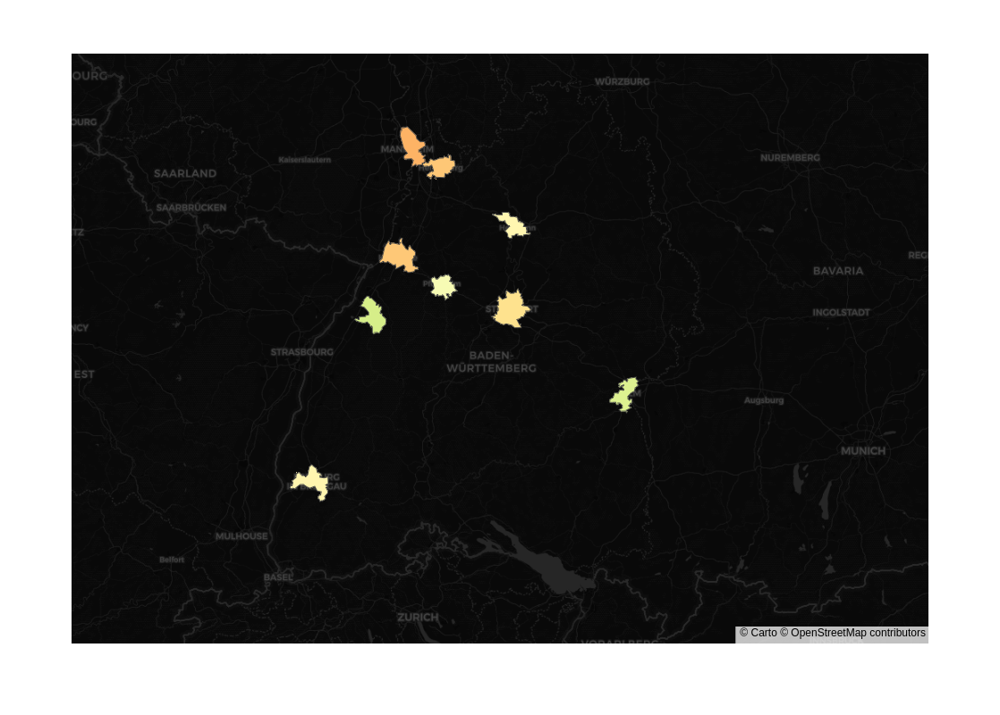

In [127]:
# Display all BW cities
fig = create_state_map(bw_merged_cities, 'Baden-Württemberg', 100, 1)
fig.show() # COMPLETE

#### Add Landkreise

In [128]:
# Remove already merged cities from data
bw_data_lk = bw_df[~bw_df['district'].str.endswith(', Kreisfreie Stadt')]

In [129]:
bw_data_lk.district.sort_values().unique()

array(['Alb-Donau-Kreis', 'Biberach', 'Bodenseekreis',
       'Breisgau-Hochschwarzwald', 'Böblingen', 'Calw', 'Emmendingen',
       'Enzkreis', 'Esslingen', 'Freudenstadt', 'Göppingen', 'Heidenheim',
       'Heilbronn', 'Hohenlohekreis', 'Karlsruhe', 'Konstanz',
       'Ludwigsburg', 'Lörrach', 'Main-Tauber-Kreis',
       'Neckar-Odenwald-Kreis', 'Ortenaukreis', 'Ostalbkreis', 'Rastatt',
       'Ravensburg', 'Rems-Murr-Kreis', 'Reutlingen',
       'Rhein-Neckar-Kreis', 'Rottweil', 'Schwarzwald-Baar-Kreis',
       'Schwäbisch Hall', 'Sigmaringen', 'Tuttlingen', 'Tübingen',
       'Waldshut', 'Zollernalbkreis'], dtype=object)

In [130]:
# Show geodata
bw_geo_lk = bw_geo[bw_geo['district_type'] != "Kreisfreie Städte"]

In [131]:
# Create dictionary for mismatches: 'geo':'data' -> convert to 'data'
bw_lk_match_dict = {
    'Alb-Donau': 'Alb-Donau-Kreis',
    'Bodensee': 'Bodenseekreis',
    'Enz': 'Enzkreis',
    'Hohenlohe': 'Hohenlohekreis',
    'Main-Tauber': 'Main-Tauber-Kreis'
}

In [132]:
bw_geo_lk

,federal_state,district,district_type,geometry
9,Baden-Württemberg,Alb-Donau,Landkreise,"POLYGON ((9.58700 48.53665, 9.59255 48.54044, ..."
10,Baden-Württemberg,Biberach,Landkreise,"POLYGON ((9.34670 48.24053, 9.36385 48.22967, ..."
11,Baden-Württemberg,Bodensee,Landkreise,"POLYGON ((9.41002 47.82195, 9.42666 47.82219, ..."
12,Baden-Württemberg,Breisgau-Hochschwarzwald,Landkreise,"POLYGON ((7.57809 48.11961, 7.58096 48.11911, ..."
13,Baden-Württemberg,Böblingen,Landkreise,"POLYGON ((8.92793 48.86775, 8.93925 48.86793, ..."
14,Baden-Württemberg,Calw,Landkreise,"POLYGON ((8.70279 48.83761, 8.70299 48.83383, ..."
15,Baden-Württemberg,Emmendingen,Landkreise,"POLYGON ((7.68154 48.25993, 7.70373 48.26050, ..."
16,Baden-Württemberg,Enz,Landkreise,"POLYGON ((8.87686 49.06552, 8.87763 49.05398, ..."
17,Baden-Württemberg,Esslingen,Landkreise,"POLYGON ((9.50889 48.75354, 9.51463 48.74993, ..."
18,Baden-Württemberg,Freudenstadt,Landkreise,"POLYGON ((8.22160 48.60462, 8.23282 48.60490, ..."


In [133]:
# Rename districts in geoset
bw_geo_lk = bw_geo_lk.copy()
bw_geo_lk['district'] = bw_geo_lk['district'].replace(bw_lk_match_dict)

In [134]:
bw_merged_lk = pd.merge(bw_data_lk, bw_geo_lk, on='district')

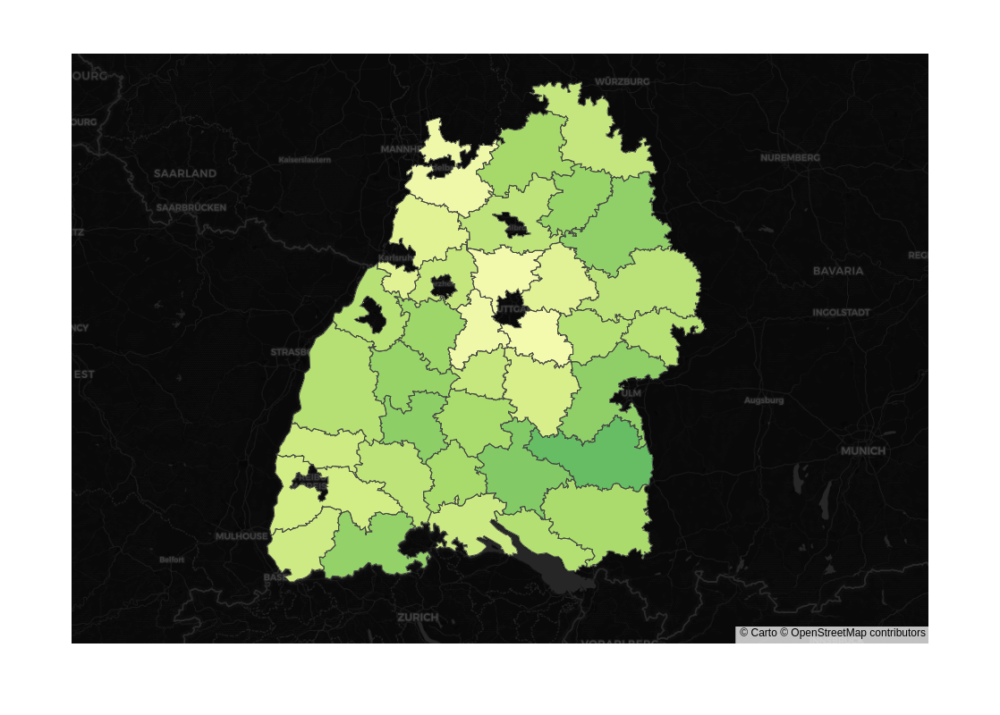

In [135]:
# Display all BW Landkreise
fig = create_state_map(bw_merged_lk, 'Baden-Württemberg', 100, 1)
fig.show() # COMPLETE

In [136]:
# Merge Cities with Landkreise
bw_full = pd.concat([bw_merged_cities, bw_merged_lk], axis=0)

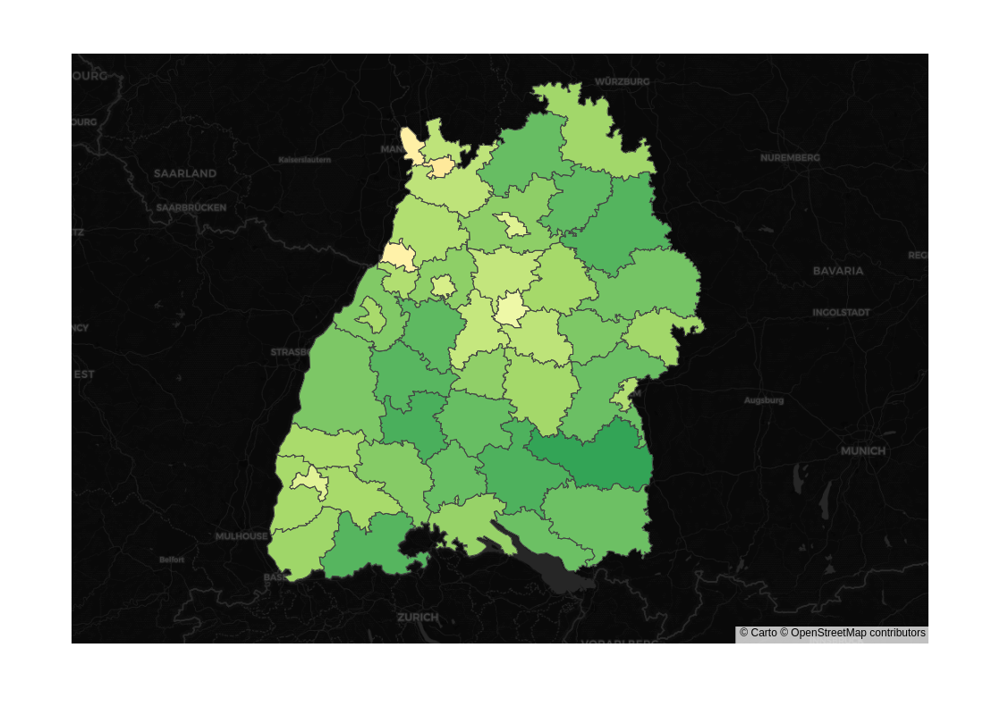

In [137]:
# Display full map
fig = create_state_map(bw_full, 'Baden-Württemberg', 100, 0)
fig.show()

--------------------------

<center><b>BADEN-WÜRTTEMBERG MAP IS COMPLETE</b></center>

-------------------

In [138]:
# Export data
# bw_full.to_csv("bw_data_geo.csv")

## Bayern

In [139]:
# Create copy for editing
by_df = raw_data_df.copy()

####  Process geodata

In [140]:
# Read in geojson -> geopandas
by_geojson = gpd.read_file('output_geojsons/Bayern.geojson')

In [141]:
# Process
by_geojson = process_gpd_geojson(by_geojson)

In [142]:
# Check
by_geojson['district_type'].value_counts() # KORREKT

district_type
Landkreise           71
Kreisfreie Städte    25
Name: count, dtype: int64

In [143]:
by_geo = by_geojson.copy()
by_geo_cities = by_geo[by_geo['district_type'] == 'Kreisfreie Städte'] 

In [144]:
# Create match dictionary
by_match_dict = {
    'Munich': 'München',
    'Nuremberg': 'Nürnberg',
    'Kempten': 'Kempten (Allgäu)', # identified later
    'Weiden': 'Weiden i.d. OPf.' # identified later
    
}
# INTEGRATED IDENTIFIED MISSING MATCHES (Kempten, Weiden)

In [145]:
# Renaming
by_geo_cities.loc[:, 'district'] = by_geo_cities['district'].replace(by_match_dict).copy()

In [146]:
by_geo_cities = by_geo_cities.copy()
by_geo_cities['district'] = by_geo_cities['district'] + ', Kreisfreie Stadt'

In [147]:
by_merged_cities = pd.merge(by_df, by_geo_cities, on='district')

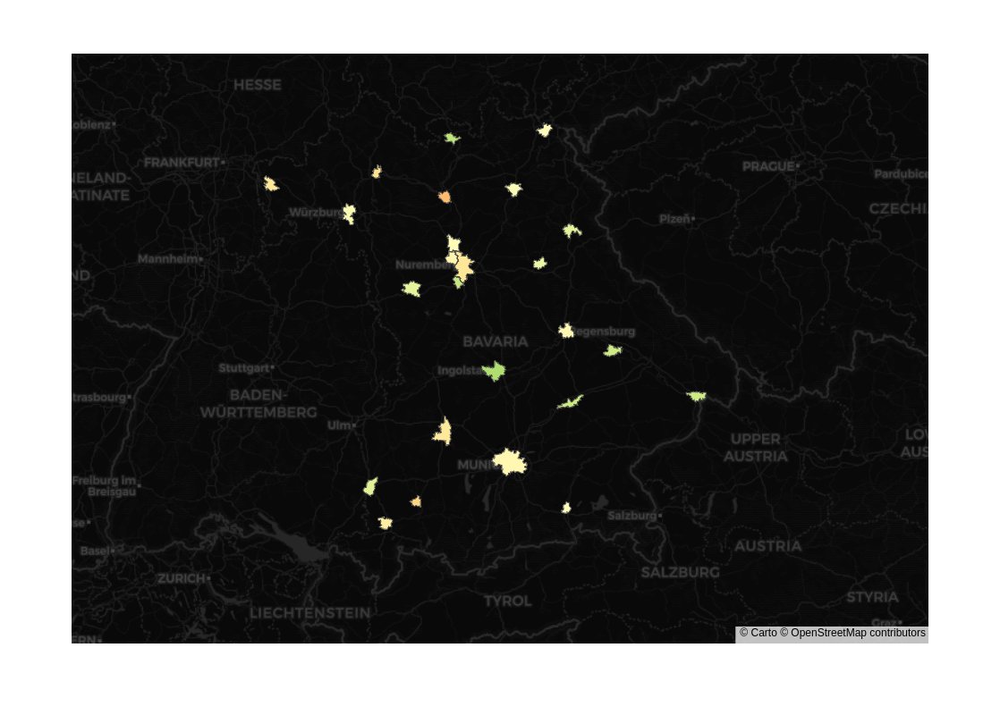

In [148]:
# Display all Bayern cities
fig = create_state_map(by_merged_cities, 'Bayern', 100, 1)
fig.show()

In [149]:
# Remove already merged cities from data
by_data_lk = remove_cities(by_df)

In [150]:
# Show geodata
by_geo_lk = by_geo[by_geo['district_type'] != "Kreisfreie Städte"]

In [151]:
by_geo_lk.shape # Geodaten for 71 "Landkreise"

(71, 4)

In [152]:
by_df

,district,building_type,heat_source,value
0,"Flensburg, Kreisfreie Stadt",100,0,0.6492
1,"Flensburg, Kreisfreie Stadt",100,4,0.3281
2,"Flensburg, Kreisfreie Stadt",100,2,0.4203
3,"Flensburg, Kreisfreie Stadt",100,3,0.2073
4,"Flensburg, Kreisfreie Stadt",100,1,0.5565
...,...,...,...,...
12055,Ludwigslust-Parchim,100,4,0.5854
12056,Ludwigslust-Parchim,100,2,0.6517
12057,Ludwigslust-Parchim,100,3,0.4252
12058,Ludwigslust-Parchim,100,1,0.8306


In [153]:
# Merge data with LK
by_merged_lk = pd.merge(by_df, by_geo_lk, on='district')

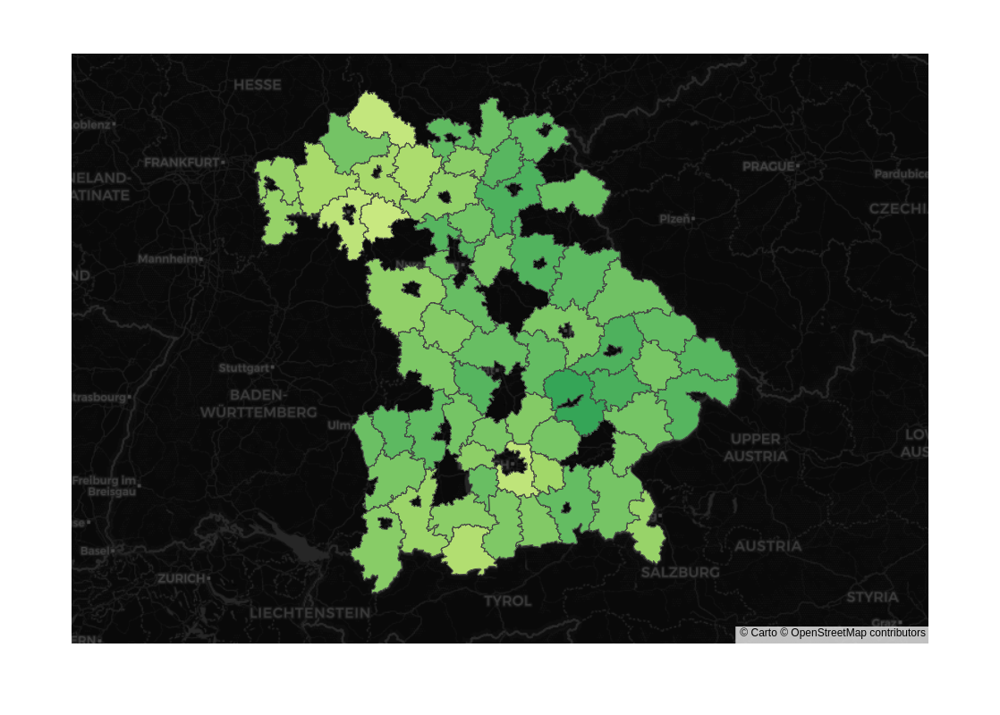

In [154]:
# Map with all "Landkreise"
fig = create_state_map(by_merged_lk, "Bayern", 100, 0)
fig.show()

In [155]:
1860 / 30 # = 62 -> 9 Landkreise missing (71 in total)

62.0

In [156]:
# Identify missing Landkreise
set_by_geo_lk = set(by_geo_lk['district'])
set_by_merged_lk = set(by_merged_lk['district'])

In [157]:
set_diff_BY = set_by_geo_lk - set_by_merged_lk
set_diff_BY # Namen aus GEO welche keinen Match in DATA gefunden haben

{'Dillingen',
 'Landsberg',
 'Lindau',
 'Mühldorf',
 'Neumarkt',
 'Neustadt',
 'Neustadt-Bad Windsheim',
 'Pfaffenhofen',
 'Wunsiedel'}

In [158]:
fuzzy_search(by_df, set_diff_by, 80)

NameError: name 'set_diff_by' is not defined

In [ ]:
# Rename districts in geodata to match correct corresponding districts in the heat pump dataset
by_geo_lk.loc[by_geo_lk['district'] == 'Neumarkt', 'district'] = 'Neumarkt i.d. OPf.'
by_geo_lk.loc[by_geo_lk['district'] == 'Landsberg', 'district'] = 'Landsberg am Lech'
by_geo_lk.loc[by_geo_lk['district'] == 'Neustadt-Bad Windsheim', 'district'] = 'Neustadt a.d. Aisch-Bad Windsheim'
by_geo_lk.loc[by_geo_lk['district'] == 'Neustadt', 'district'] = 'Neustadt a.d. Waldnaab'
by_geo_lk.loc[by_geo_lk['district'] == 'Pfaffenhofen', 'district'] = 'Pfaffenhofen a.d. Ilm'
by_geo_lk.loc[by_geo_lk['district'] == 'Lindau', 'district'] = 'Lindau (Bodensee)'
by_geo_lk.loc[by_geo_lk['district'] == 'Wunsiedel', 'district'] = 'Wunsiedel i. Fichtelgebirge'
by_geo_lk.loc[by_geo_lk['district'] == 'Mühldorf', 'district'] = 'Mühldorf a. Inn'
by_geo_lk.loc[by_geo_lk['district'] == 'Dillingen', 'district'] = 'Dillingen a.d. Donau'

In [ ]:
# Update merged_lk with full geo lk data
by_merged_lk = pd.merge(by_df, by_geo_lk, on='district')

In [ ]:
# Map with all "Landkreise", complete
fig = create_state_map(by_merged_lk, "Bayern", 100, 0)
fig.show()

In [ ]:
# Merge with cities
by_full = pd.concat([by_merged_cities, by_merged_lk])

In [ ]:
# Draw full map for Bayern
fig = create_state_map(by_full, "Bayern", 100, 1)
fig.show()

-> still missing: Kempten (Allgäu) [FIXED], Weiden in der Oberpfalz [FIXED]

In [ ]:
by_df[by_df['district'].str.startswith("Kempten")][['district']].head(1)

In [ ]:
by_df[by_df['district'].str.startswith("Weiden")][['district']].head(1)

In [ ]:
# Export Bayern data
# by_full.to_csv("by_full_data.csv")

------------------------------------------------------------------------

<center><b>BAYERN MAP IS COMPLETE</b></center>

-----------------------

## Brandenburg

In [ ]:
# Create DATA copy for editing
bb_df = raw_data_df.copy()

In [ ]:
# Read in geojson -> geopandas
bb_geojson = gpd.read_file(f'output_geojsons/Brandenburg.geojson')

# Process
bb_geojson = process_gpd_geojson(bb_geojson)

# Check
bb_geojson['district_type'].value_counts() # CORRECT

-----------------------------------------------

In [ ]:
bb_geo = bb_geojson.copy()
bb_geo_cities = bb_geo[bb_geo['district_type'] == 'Kreisfreie Städte']
bb_geo_lk = bb_geo[bb_geo['district_type'] != 'Kreisfreie Städte'] 

In [ ]:
bb_geo_cities[['district']]

In [ ]:
bb_cities_set = set(bb_geo_cities['district'])
bb_lk_set = set(bb_geo_lk['district'])

In [ ]:
fuzzy_search(bb_df, bb_cities_set, 80)

In [ ]:
# Create cities match dictionary for Brandenburg
bb_cities_match_dict = {
    'Frankfurt am Oder': 'Frankfurt (Oder)',
    'Cottbus': 'Cottbus, Kreisfreie Stadt',
    'Potsdam': 'Potsdam, Kreisfreie Stadt',
    'Brandenburg an der Havel': 'Brandenburg an der Havel, Kreisfreie Stadt'
}

In [ ]:
# Rename cities w/ cities match dict
bb_geo.loc[:, 'district'] = bb_geo['district'].replace(bb_cities_match_dict)

In [ ]:
fuzzy_search(bb_df, bb_lk_set, 80) # Everything's fine -> bb_geo is ready for full merge

In [ ]:
bb_full = pd.merge(bb_df, bb_geo, on='district')

In [ ]:
fig = create_state_map(bb_full, 'Brandenburg', 100, 0)
fig.show()

-> TODO: DISPLAY TOGETHER WITH BERLIN

In [ ]:
# Export Brandenburg data
# bb_full.to_csv("bb_full_data.csv")

------------------

<center><b>BRANDENBURG MAP IS COMPLETE</b></center>

------------------------------------

## Bremen 

In [ ]:
# Create DATA copy for editing
hb_df = raw_data_df.copy()

In [ ]:
# Read in geojson -> geopandas
hb1_geojson = gpd.read_file(f'output_geojsons/Bremen_Stadt.geojson')
hb1_geojson

In [ ]:
# Process
hb1_geojson = process_gpd_geojson(hb1_geojson)

# Check
hb1_geojson['district_type'].value_counts() # BREMERHAVEN IS MISSING

In [ ]:
hb1_geojson

In [ ]:
hb1_geojson.loc[0, 'district'] = 'Bremen, Kreisfreie Stadt'

In [ ]:
hb1_geojson

In [ ]:
hb2_geojson = gpd.read_file(f'output_geojsons/Bremerhaven.geojson')
hb2_geojson = hb2_geojson[['geometry']]
bremerhaven_dict = {'federal_state': 'Bremen', 'district': 'Bremerhaven, Kreisfreie Stadt', 'district_type': 'Kreisfreie Städte'}

In [ ]:
for idx, (col_name, col_data) in enumerate(bremerhaven_dict.items()):
    hb2_geojson.insert(0, col_name, col_data)

In [ ]:
hb2_geojson

In [ ]:
hb_geojson = pd.concat([hb1_geojson, hb2_geojson], axis=0)
hb_geojson = hb_geojson.reset_index(drop=True)

In [ ]:
hb_geojson

In [ ]:
hb_df[hb_df['district'].str.startswith('Breme')]['district'].unique()

In [ ]:
hb_full = pd.merge(hb_df, hb_geojson, on='district')

In [ ]:
hb_full

In [ ]:
fig = create_state_map(hb_full, 'Bremen', 100, 0)
fig.show()

In [ ]:
#Export data
#hb_full.to_csv("hb_data_geo.csv")

## Hamburg

In [ ]:
# Create DATA copy for editing
hh_df = raw_data_df.copy()

In [ ]:
# Read in geojson -> geopandas
hh_geojson = gpd.read_file(f'output_geojsons/Hamburg.geojson')

# Process
hh_geojson = process_gpd_geojson(hh_geojson)

# Check
hh_geojson['district_type'].value_counts() # CORRECT

In [ ]:
hh_geo = hh_geojson.copy()
hh_geo

In [ ]:
hh_full = pd.merge(hh_df, hh_geo, on='district')

In [ ]:
fig = create_state_map(hh_full, 'Hamburg', 100, 0)
fig.show()

In [ ]:
# hh_full.to_csv("hh_full_data.csv")

------------------------------

<center><b>HAMBURG MAP IS COMPLETE</b></center>

------------------------------

## Hessen

In [ ]:
# Create DATA copy for editing
he_df = raw_data_df.copy()

In [ ]:
# Read in geojson -> geopandas
he_geojson = gpd.read_file(f'output_geojsons/Hessen.geojson')

# Process
he_geojson = process_gpd_geojson(he_geojson)

# Check
he_geojson['district_type'].value_counts() # should be 21 Landkreise + 5 Kreisfreie Städte

In [ ]:
he_geo = he_geojson.copy()
he_geo_cities = he_geo[he_geo['district_type'] == 'Kreisfreie Städte']
he_geo_lk = he_geo[he_geo['district_type'] != 'Kreisfreie Städte'] 

In [ ]:
he_geo_cities

In [ ]:
he_geo.loc[he_geo['district'] == 'Main-Taunus-Kreis', 'district_type'] = 'Landkreise'

In [ ]:
he_geo_cities = he_geo[he_geo['district_type'] == 'Kreisfreie Städte']
he_geo_lk = he_geo[he_geo['district_type'] != 'Kreisfreie Städte'] 

In [ ]:
he_geo.district_type.value_counts() # CORRECT

In [ ]:
fuzzy_search(he_df, set(he_geo_cities['district']), 80)

In [ ]:
he_cities_match_dict = {
    'Offenbach am Main': 'Offenbach am Main, Kreisfreie Stadt',
    'Frankfurt am Main': 'Frankfurt am Main, Kreisfreie Stadt',
    'Darmstadt': 'Darmstadt, Kreisfreie Stadt',
    'Wiesbaden': 'Wiesbaden, Kreisfreie Stadt',
    'Kassel': 'Kassel, Kreisfreie Stadt'
}

In [ ]:
# Rename cities w/ cities match dict
he_geo_cities.loc[:, 'district'] = he_geo_cities['district'].replace(he_cities_match_dict)

In [ ]:
he_merged_cities = pd.merge(he_df, he_geo_cities, on='district')

In [ ]:
fig = create_state_map(he_merged_cities, 'Hessen', 100, 0)
fig.show()

In [ ]:
he_geo_lk.shape

In [ ]:
fuzzy_search(he_df, set(he_geo_lk['district']), 80)

In [ ]:
he_merged_lk

In [ ]:
he_merged_lk = pd.merge(he_df, he_geo_lk, on='district')

In [ ]:
fig = create_state_map(he_merged_lk, 'Hessen', 100, 0)
fig.show()

In [ ]:
he_full = pd.concat([he_merged_cities, he_merged_lk])

In [ ]:
fig = create_state_map(he_full, 'Hessen', 100, 0)
fig.show()

In [ ]:
# he_full.to_csv('he_full_data.csv')

------------------------------------

<center><b>HESSEN MAP IS COMPLETE</b></center>

---------------------------

## Mecklenburg-Vorpommern

In [ ]:
# Create DATA copy for editing
mv_df = raw_data_df.copy()

In [ ]:
# Read in geojson -> geopandas
mv_geojson = gpd.read_file(f'output_geojsons/Mecklenburg-Vorpommern.geojson')

# Process
#mv_geojson = process_gpd_geojson(mv_geojson)

# Check
#mv_geojson['district_type'].value_counts() # Sollten 6 Landkreise und 2 Städte sein...

In [ ]:
mv_geojson

In [ ]:
mv_full

In [ ]:
mv_geojson = mv_geojson[['krs_name', 'lan_name', 'krs_type', 'geometry']]
mv_geojson['krs_name'] = mv_geojson['krs_name'].str[0]
mv_geojson['lan_name'] = mv_geojson['lan_name'].str[0]
mv_geojson['krs_type'] = mv_geojson['krs_type'].str[0]
mv_geojson

In [ ]:
mv_geojson = mv_geojson.rename(columns={'krs_name': 'district', 'krs_type': 'district_type', 'lan_name': 'federal_state'})

In [ ]:
fuzzy_search(mv_df, set(mv_geojson['district']), 70)

In [ ]:
mv_match_dict = {
    'Landkreis Vorpommern-Rügen': 'Vorpommern-Rügen',
    'Kreisfreie Stadt Rostock': 'Rostock, Kreisfreie Stadt',
    'Kreisfreie Stadt Schwerin': 'Schwerin, Kreisfreie Stadt',
    'Landkreis Mecklenburgische Seenplatte': 'Mecklenburgische Seenplatte',
    'Landkreis Vorpommern-Greifswald': 'Vorpommern-Greifswald',
    'Landkreis Nordwestmecklenburg': 'Nordwestmecklenburg',
    'Landkreis Rostock': 'Rostock',
    'Landkreis Ludwigslust-Parchim': 'Ludwigslust-Parchim'
}

In [ ]:
mv_geo = mv_geojson.copy()
mv_geo.loc[:, 'district'] = mv_geo['district'].replace(mv_match_dict)

In [ ]:
mv_full = pd.merge(mv_df, mv_geo, on='district')

In [ ]:
fig = create_state_map(mv_full, 'Mecklenburg-Vorpommern', 100, 0)
fig.show()

In [ ]:
# Export MV
#mv_full.to_csv("mv_full_data.csv")

## Niedersachsen

In [ ]:
# Create DATA copy for editing
ni_df = raw_data_df.copy()

In [ ]:
# Read in geojson -> geopandas
ni_geojson = gpd.read_file(f'output_geojsons/Niedersachsen.geojson')

# Process
#ni_geojson = process_gpd_geojson(ni_geojson)

# Check
#ni_geojson['district_type'].value_counts() # 37LK + 8KfS

In [ ]:
ni_geojson = ni_geojson[['krs_name', 'lan_name', 'krs_type', 'geometry']]
ni_geojson['krs_name'] = ni_geojson['krs_name'].str[0]
ni_geojson['lan_name'] = ni_geojson['lan_name'].str[0]
ni_geojson['krs_type'] = ni_geojson['krs_type'].str[0]
ni_geojson

In [ ]:
ni_geojson = ni_geojson.rename(columns={'krs_name': 'district', 'krs_type': 'district_type', 'lan_name': 'federal_state'})

In [ ]:
fuzzy_search(ni_df, set(ni_geojson['district']), 70)

In [ ]:
# Naming discrepencies are consistent, no dict necessary -> regex
ni_geojson['district'] = ni_geojson['district'].str.replace(r'^Kreisfreie Stadt (.+)$', r'\1, Kreisfreie Stadt', regex=True)
ni_geojson['district'] = ni_geojson['district'].str.replace(r'^Landkreis ', '', regex=True)

In [ ]:
ni_geojson

In [ ]:
ni_full = pd.merge(ni_df, ni_geojson, on='district')

In [ ]:
fig = create_state_map(ni_full, 'Niedersachsen', 100, 0)
fig.show()

In [ ]:
# Export
# ni_full.to_csv('ni_full_data.csv')

## Nordrhein-Westfalen

In [ ]:
# Create DATA copy for editing
nw_df = raw_data_df.copy()

In [ ]:
# Read in geojson -> geopandas
nw_geojson = gpd.read_file(f'output_geojsons/Nordrhein-Westfalen.geojson')

# Process
nw_geojson = process_gpd_geojson(nw_geojson)

# Check
nw_geojson['district_type'].value_counts() # 31 LK + 22 S 

In [ ]:
nw_geojson[nw_geojson['district_type'] == 'Kreisfreie Städte']

In [ ]:
nw_geojson[nw_geojson['district_type'] != 'Kreisfreie Städte']

Sonderfall Aachen: GEO: LK + S, DATA: Städteregion Aachen

In [ ]:
fuzzy_search(nw_df, set(nw_geojson['district']), 80)

In [ ]:
nw_match_dict = {
    'Leverkusen': 'Leverkusen, Kreisfreie Stadt',
    'Cleves': 'Kleve',
    'Essen': 'Essen, Kreisfreie Stadt',
    'Krefeld': 'Krefeld, Kreisfreie Stadt',
    'Düsseldorf': 'Düsseldorf, Kreisfreie Stadt',
    'Cologne': 'Köln, Kreisfreie Stadt',
    'Duisburg': 'Duisburg, Kreisfreie Stadt',
    'Dortmund': 'Dortmund, Kreisfreie Stadt',
    'Gelsenkirchen': 'Gelsenkirchen, Kreisfreie Stadt',
    'Bottrop': 'Bottrop, Kreisfreie Stadt',
    'Bochum': 'Bochum, Kreisfreie Stadt',
    'Münster': 'Münster, Kreisfreie Stadt',
    'Mülheim': 'Mülheim an der Ruhr, Kreisfreie Stadt',
    'Solingen': 'Solingen, Kreisfreie Stadt',
    'Wuppertal': 'Wuppertal, Kreisfreie Stadt',
    'Mönchengladbach': 'Mönchengladbach, Kreisfreie Stadt',
    'Ennepe-Ruhr': 'Ennepe-Ruhr-Kreis',
    'Hamm': 'Hamm, Kreisfreie Stadt',
    'Herne': 'Herne, Kreisfreie Stadt',
    'Oberhausen': 'Oberhausen, Kreisfreie Stadt',
    'Bielefeld': 'Bielefeld, Kreisfreie Stadt',
    'Hagen': 'Hagen, Kreisfreie Stadt',
    'Rhein-Sieg': 'Rhein-Sieg-Kreis',
    'Remscheid': 'Remscheid, Kreisfreie Stadt',
    'Bonn': 'Bonn, Kreisfreie Stadt'
}

In [ ]:
nw_geo = nw_geojson.copy()
nw_geo.loc[:, 'district'] = nw_geo['district'].replace(nw_match_dict)

In [ ]:
nw_full_without_aachen = pd.merge(nw_df, nw_geo, on='district')

In [ ]:
fig = create_state_map(nw_full_without_aachen, 'Nordrhein-Westfalen', 100, 0)
fig.show()

In [ ]:
# Add Aachen, use same DATA for differing GEO
aachen_geo_city = nw_geo[nw_geo['district'] == 'Aachen'].iloc[[0]]
aachen_geo_lk = nw_geo[nw_geo['district'] == 'Aachen'].iloc[[1]]

In [ ]:
aachen_data = nw_df[nw_df['district'].str.contains('Aachen')]

In [ ]:
aachen_geo_lk['district'] = 'Städteregion Aachen'
aachen_geo_city['district'] = 'Städteregion Aachen'

In [ ]:
# Merge with Aachen LK GEO
aachen_merged_lk = pd.merge(nw_df, aachen_geo_lk, on='district')

In [ ]:
# Merge with Aachen City GEO
aachen_merged_city = pd.merge(nw_df, aachen_geo_city, on='district')

In [ ]:
# Rename city region of Aachen
aachen_merged_city.loc[:, 'district'] = 'Aachen (Stadt)'

In [ ]:
# Combine NRW data with Aachen
nw_full = pd.concat([nw_full_without_aachen, aachen_merged_lk, aachen_merged_city])

In [ ]:
# Show complete NRW map
fig = create_state_map(nw_full, 'Nordrhein-Westfalen', 100, 0)
fig.show()

In [ ]:
# Export full NRW-Data
# nw_full.to_csv("nw_full_data.csv")

---------------------------------

<center><b>NORDRHEIN-WESTFALEN MAP COMPLETE</b></center>

-----------------------

## Rheinland-Pfalz 

In [ ]:
# Create DATA copy for editing
rp_df = raw_data_df.copy()

In [ ]:
# Read in geojson -> geopandas
rp_geojson = gpd.read_file(f'output_geojsons/Rheinland-Pfalz.geojson')

# Process
rp_geojson = process_gpd_geojson(rp_geojson)

# Check
rp_geojson['district_type'].value_counts() # 24 LK + 12 S

In [ ]:
rp_geo = rp_geojson.copy()

In [ ]:
rp_geo[rp_geo['district_type'] == 'Kreisfreie Städte']

--> Pirmasens is <b>missing</b> from GEO

In [ ]:
rp_geo

Datasource for NUTS: https://ec.europa.eu/eurostat/web/gisco/geodata/reference-data/administrative-units-statistical-units/nuts

In [ ]:
# Read in NUTS geojson file into geopandas
nuts = gpd.read_file("output_geojsons/NUTS_RG_01M_2021_4326.geojson")

In [ ]:
# Get Pirmasens GEO
pirmasens_geo = nuts[nuts['NUTS_ID'] == 'DEB37']
pirmasens_geo = pirmasens_geo.rename(columns={'NAME_LATN': 'district'})
pirmasens_geo = pirmasens_geo.loc[:, ['district', 'geometry']]

In [ ]:
# Add columns to fit format
pirmasens_geo.insert(0, 'federal_state', 'Rheinland-Pfalz')
pirmasens_geo.insert(2, 'district_type', 'Kreisfreie Städte')

In [ ]:
rp_geo.crs

In [ ]:
pirmasens_geo.crs

In [ ]:
# Different Coordinate Reference Systems (CRS) -> convert before concat
# pirmasens_geo = pirmasens_geo.to_crs(rp_geo.crs)

In [ ]:
# Add Pirmasens to GEO
rp_geo = pd.concat([pirmasens_geo, rp_geo])

In [ ]:
rp_geo = rp_geo.reset_index(drop=True)

In [ ]:
# Do the fuzzy match
fuzzy_search(rp_df, set(rp_geo['district']), 80)

In [ ]:
# Create dictionaries for string transformation
rp_cities_match_dict = {
    'Trier': 'Trier, Kreisfreie Stadt',
    'Zweibrücken': 'Zweibrücken, Kreisfreie Stadt',
    'Landau': 'Landau in der Pfalz, Kreisfreie Stadt',
    'Speyer Spires': 'Speyer, Kreisfreie Stadt',
    'Ludwigshafen': 'Ludwigshafen am Rhein, Kreisfreie Stadt',
    'Koblenz Coblenz': 'Koblenz, Kreisfreie Stadt',
    'Neustadt': 'Neustadt an der Weinstraße, Kreisfreie Stadt',
    'Mainz': 'Mainz, Kreisfreie Stadt',
    'Frankenthal': 'Frankenthal (Pfalz), Kreisfreie Stadt',
    'Worms': 'Worms, Kreisfreie Stadt',
    'Kaiserslautern': 'Kaiserslautern, Kreisfreie Stadt'
}

rp_lk_match_dict = {
    'Altenkirchen': 'Altenkirchen (Westerwald)',
    'Rhein-Lahn': 'Rhein-Lahn-Kreis',
    'Bitburg-Prüm': 'Eifelkreis Bitburg-Prüm',
    'Rhein-Hunsrück': 'Rhein-Hunsrück-Kreis'
}

In [ ]:
rp_geo_cities = rp_geo.loc[rp_geo['district_type'] == 'Kreisfreie Städte'].copy()
rp_geo_cities.loc[:, 'district'] = rp_geo_cities['district'].replace(rp_cities_match_dict)
rp_geo_cities

In [ ]:
rp_merged_cities = pd.merge(rp_df, rp_geo_cities, on='district')

In [ ]:
fig = create_state_map(rp_merged_cities, 'Rheinland-Pfalz', 100, 0)
fig.show()

In [ ]:
rp_geo_lk = rp_geo.loc[rp_geo['district_type'] != 'Kreisfreie Städte'].copy()
rp_geo_lk.loc[:, 'district'] = rp_geo_lk['district'].replace(rp_lk_match_dict)
rp_geo_lk

In [ ]:
rp_merged_lk = pd.merge(rp_df, rp_geo_lk, on='district')

In [ ]:
fig = create_state_map(rp_merged_lk, 'Rheinland-Pfalz', 100, 0)
fig.show()

In [ ]:
rp_full = pd.concat([rp_merged_cities, rp_merged_lk])

In [ ]:
fig = create_state_map(rp_full, 'Rheinland-Pfalz', 100, 0)
fig.show()

In [ ]:
# Fix Südwestpfalz

# Get corect Südwestpfalz GEO
suedwestpfalz_geo = nuts[nuts['NUTS_ID'] == 'DEB3K']
suedwestpfalz_geo = suedwestpfalz_geo.rename(columns={'NAME_LATN': 'district'})
suedwestpfalz_geo = suedwestpfalz_geo.loc[:, ['district', 'geometry']]

# Add columns to fit format
suedwestpfalz_geo.insert(0, 'federal_state', 'Rheinland-Pfalz')
suedwestpfalz_geo.insert(2, 'district_type', 'Landkreise')

# Different Coordinate Reference Systems (CRS) -> convert before concat
suedwestpfalz_geo = suedwestpfalz_geo.to_crs(rp_geo.crs).reset_index(drop=True)
suedwestpfalz_geo

In [ ]:
# Update Südwestpfalz geometry in rp_full
rp_full.loc[rp_full['district'] == 'Südwestpfalz', 'geometry'] = suedwestpfalz_geo.at[0, 'geometry']

In [ ]:
rp_full[rp_full['district'] == 'Südwestpfalz']

In [ ]:
fig = create_state_map(rp_full, 'Rheinland-Pfalz', 100, 0)
fig.show()

In [ ]:
# Export rp_full
# rp_full.to_csv("rp_data_full.csv")

TODO: Fix Südwestpfalz using shapely

--------------------

<center><b>RHEINLAND-PFALZ MAP (ALMOST) COMPLETE</b></center>

---------------------

## Saarland 

In [ ]:
# Create DATA copy for editing
sl_df = raw_data_df.copy()

In [ ]:
# Read in geojson -> geopandas
sl_geojson = gpd.read_file(f'output_geojsons/Saarland.geojson')

# Process
sl_geojson = process_gpd_geojson(sl_geojson)

# Check
sl_geojson['district_type'].value_counts()

In [ ]:
sl_geo = sl_geojson.copy()

In [ ]:
fuzzy_search(sl_df, set(sl_geo['district']), 80)

In [ ]:
sl_match_dict = {
    'Saarpfalz': 'Saarpfalz-Kreis',
    'Saarbrücken': 'Regionalverband Saarbrücken',
    'Sankt Wendel': 'St. Wendel'
}

In [ ]:
sl_geo.loc[:, 'district'] = sl_geo['district'].replace(sl_match_dict)

In [ ]:
sl_full = pd.merge(sl_df, sl_geo, on='district')

In [ ]:
fig = create_state_map(sl_full, 'Saarland', 100, 0)
fig.show()

In [ ]:
# Export
# sl_full.to_csv('sl_full_data.csv')

--------------------

<center><b>SAARLAND MAP COMPLETE</b></center>

---------------------

## Sachsen

In [ ]:
sn_df = raw_data_df.copy()

In [ ]:
sn_geojson = gpd.read_file("output_geojsons/Sachsen.geojson")

In [ ]:
sn_geojson = sn_geojson[['krs_name', 'lan_name', 'krs_type', 'geometry']]
sn_geojson['krs_name'] = sn_geojson['krs_name'].str[0]
sn_geojson['lan_name'] = sn_geojson['lan_name'].str[0]
sn_geojson['krs_type'] = sn_geojson['krs_type'].str[0]
sn_geojson

In [ ]:
sn_geojson = sn_geojson.rename(columns={'krs_name': 'district', 'krs_type': 'district_type', 'lan_name': 'federal_state'})

In [ ]:
fuzzy_search(sn_df, set(sn_geojson['district']), 80)

In [ ]:
sn_geojson['district'] = sn_geojson['district'].str.replace(r'^Landkreis ', '', regex=True)
sn_geojson['district'] = sn_geojson['district'].str.replace(r'^Kreisfreie Stadt ', '', regex=True)

In [ ]:
sn_full = pd.merge(sn_df, sn_geojson, on='district')

In [ ]:
fig = create_state_map(sn_full, 'Sachsen', 100, 0)
fig.show()

In [ ]:
leipzig_geo = sn_full.loc[sn_full['district'] == 'Leipzig']
leipzig_geo_array = leipzig_geo['geometry'].unique()

In [ ]:
leipzig_geo_array

In [ ]:
leipzig_geo_series = gpd.GeoSeries(leipzig_geo_array)

In [ ]:
leipzig_geo_united = leipzig_geo_series.unary_union

In [ ]:
leipzig_geo_united

In [ ]:
# Update all Geodata with merged Leipzig (city + district)
sn_full.loc[sn_full['district'] == 'Leipzig', 'geometry'] = leipzig_geo_united

In [ ]:
fig = create_state_map(sn_full, 'Sachsen', 100, 0)
fig.show()

In [ ]:
# Export
# sn_full.to_csv("sn_full_data.csv")

## Sachsen-Anhalt

In [167]:
st_df = raw_data_df.copy()
st_geojson = gpd.read_file("output_geojsons/Sachsen-Anhalt.geojson")
# st_geo = process_gpd_geojson(st_geo)

In [168]:
st_geojson

,geo_point_2d,year,lan_code,lan_name,krs_code,krs_name,krs_area_code,krs_type,krs_name_short,geometry
0,"{'lon': 12.701603860503596, 'lat': 51.82015158...",2021,[15],[Sachsen-Anhalt],[15091],[Landkreis Wittenberg],DEU,Landkreis,[Wittenberg],"POLYGON ((13.05103 51.64768, 13.07725 51.65772..."
1,"{'lon': 11.227028068183877, 'lat': 52.68002085...",2021,[15],[Sachsen-Anhalt],[15081],[Landkreis Altmarkkreis Salzwedel],DEU,Landkreis,[Landkreis Altmarkkreis Salzwedel],"POLYGON ((10.84156 52.85220, 10.84001 52.85040..."
2,"{'lon': 10.958572471305326, 'lat': 51.82128245...",2021,[15],[Sachsen-Anhalt],[15085],[Landkreis Harz],DEU,Landkreis,[Harz],"POLYGON ((10.70137 51.64219, 10.70912 51.64070..."
3,"{'lon': 11.642693654061462, 'lat': 51.85184876...",2021,[15],[Sachsen-Anhalt],[15089],[Landkreis Salzlandkreis],DEU,Landkreis,[Landkreis Salzlandkreis],"MULTIPOLYGON (((11.76236 52.07307, 11.75879 52..."
4,"{'lon': 11.883450784477223, 'lat': 51.14722800...",2021,[15],[Sachsen-Anhalt],[15084],[Landkreis Burgenlandkreis],DEU,Landkreis,[Landkreis Burgenlandkreis],"MULTIPOLYGON (((12.17090 51.27551, 12.16806 51..."
5,"{'lon': 11.865476117249147, 'lat': 51.42568942...",2021,[15],[Sachsen-Anhalt],[15088],[Landkreis Saalekreis],DEU,Landkreis,[Landkreis Saalekreis],"MULTIPOLYGON (((12.19354 51.33252, 12.19265 51..."
6,"{'lon': 12.02652789529489, 'lat': 52.260783937...",2021,[15],[Sachsen-Anhalt],[15086],[Landkreis Jerichower Land],DEU,Landkreis,[Jerichower Land],"POLYGON ((12.17129 52.50618, 12.16240 52.50099..."
7,"{'lon': 12.143240547916697, 'lat': 51.79543382...",2021,[15],[Sachsen-Anhalt],[15082],[Landkreis Anhalt-Bitterfeld],DEU,Landkreis,[Anhalt-Bitterfeld],"MULTIPOLYGON (((12.58026 51.62607, 12.57495 51..."
8,"{'lon': 11.641312433266956, 'lat': 52.11651207...",2021,[15],[Sachsen-Anhalt],[15003],[Kreisfreie Stadt Magdeburg],DEU,Kreisfreie Stadt,[Magdeburg],"POLYGON ((11.76333 52.07647, 11.76177 52.07610..."
9,"{'lon': 11.839510323522166, 'lat': 52.69679805...",2021,[15],[Sachsen-Anhalt],[15090],[Landkreis Stendal],DEU,Landkreis,[Stendal],"MULTIPOLYGON (((11.50503 52.94103, 11.50648 52..."


In [169]:
## 11 LK + 3 S (Kreisreform 2007)

In [170]:
st_geojson = st_geojson[['krs_name', 'lan_name', 'krs_type', 'geometry']]
st_geojson['krs_name'] = st_geojson['krs_name'].str[0]
st_geojson['lan_name'] = st_geojson['lan_name'].str[0]
st_geojson['krs_type'] = st_geojson['krs_type'].str[0]
st_geojson = st_geojson.rename(columns={'krs_name': 'district', 'krs_type': 'district_type', 'lan_name': 'federal_state'})
st_geojson

/home/th/miniconda3/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,district,federal_state,district_type,geometry
0,Landkreis Wittenberg,Sachsen-Anhalt,L,"POLYGON ((13.05103 51.64768, 13.07725 51.65772..."
1,Landkreis Altmarkkreis Salzwedel,Sachsen-Anhalt,L,"POLYGON ((10.84156 52.85220, 10.84001 52.85040..."
2,Landkreis Harz,Sachsen-Anhalt,L,"POLYGON ((10.70137 51.64219, 10.70912 51.64070..."
3,Landkreis Salzlandkreis,Sachsen-Anhalt,L,"MULTIPOLYGON (((11.76236 52.07307, 11.75879 52..."
4,Landkreis Burgenlandkreis,Sachsen-Anhalt,L,"MULTIPOLYGON (((12.17090 51.27551, 12.16806 51..."
5,Landkreis Saalekreis,Sachsen-Anhalt,L,"MULTIPOLYGON (((12.19354 51.33252, 12.19265 51..."
6,Landkreis Jerichower Land,Sachsen-Anhalt,L,"POLYGON ((12.17129 52.50618, 12.16240 52.50099..."
7,Landkreis Anhalt-Bitterfeld,Sachsen-Anhalt,L,"MULTIPOLYGON (((12.58026 51.62607, 12.57495 51..."
8,Kreisfreie Stadt Magdeburg,Sachsen-Anhalt,K,"POLYGON ((11.76333 52.07647, 11.76177 52.07610..."
9,Landkreis Stendal,Sachsen-Anhalt,L,"MULTIPOLYGON (((11.50503 52.94103, 11.50648 52..."


In [171]:
fuzzy_search(st_df, set(st_geojson['district']), 80)

----------------------------------------------------------
Geo: Kreisfreie Stadt Halle (Saale)
Data: 1. Halle (Saale), Kreisfreie Stadt 2. Neustadt an der Weinstraße, Kreisfreie Stadt 3. Saale-Orla-Kreis 4. Ulm, Kreisfreie Stadt 5. Hof, Kreisfreie Stadt 6. Kiel, Kreisfreie Stadt 7. Bonn, Kreisfreie Stadt 8. Köln, Kreisfreie Stadt 9. Hamm, Kreisfreie Stadt 10. Gera, Kreisfreie Stadt
----------------------------------------------------------
Geo: Landkreis Altmarkkreis Salzwedel
Data: 1. Altmarkkreis Salzwedel
----------------------------------------------------------
Geo: Landkreis Saalekreis
Data: 1. Saalekreis
----------------------------------------------------------
Geo: Landkreis Stendal
Data: 1. Stendal
----------------------------------------------------------
Geo: Kreisfreie Stadt Dessau-Roßlau
Data: 1. Dessau-Roßlau, Kreisfreie Stadt 2. Ulm, Kreisfreie Stadt 3. Hof, Kreisfreie Stadt 4. Kiel, Kreisfreie Stadt 5. Bonn, Kreisfreie Stadt 6. Köln, Kreisfreie Stadt 7. Hamm, Kreisfrei

In [172]:
# Naming discrepencies are consistent, no dict necessary -> regex
st_geojson['district'] = st_geojson['district'].str.replace(r'^Kreisfreie Stadt (.+)$', r'\1, Kreisfreie Stadt', regex=True)
st_geojson['district'] = st_geojson['district'].str.replace(r'^Landkreis ', '', regex=True)

In [173]:
st_full = pd.merge(st_df, st_geojson, on='district')

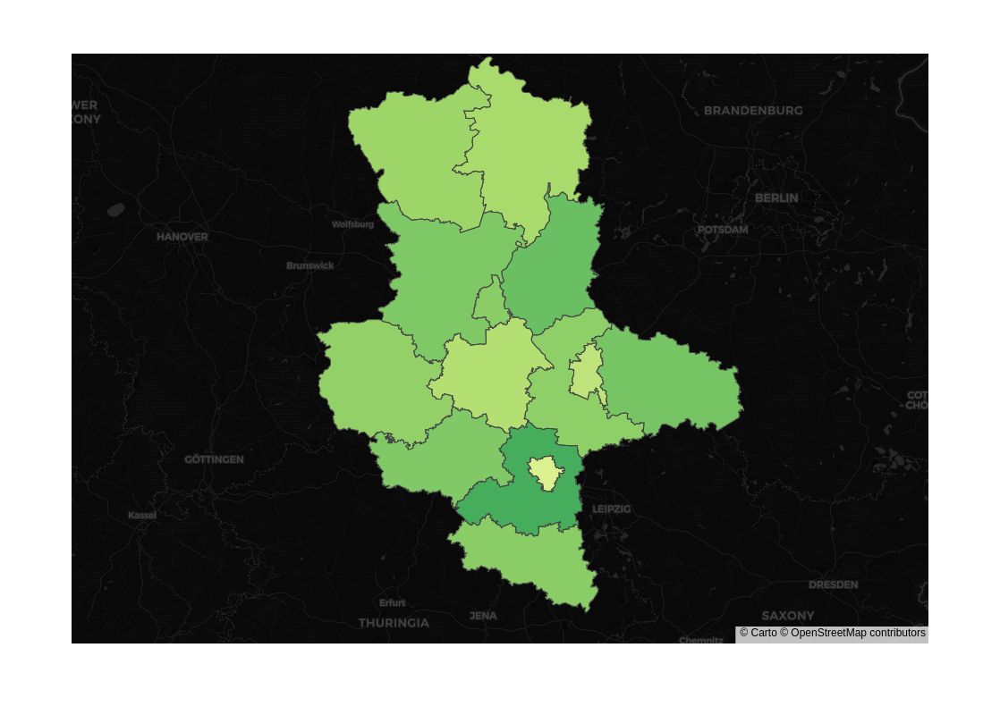

In [178]:
fig = create_state_map(st_full, 'Sachsen-Anhalt', 100, 0)
fig.show()

In [175]:
st_full.to_csv("st_full_data.csv")

## Schleswig-Holstein

In [ ]:
sh_df = raw_data_df.copy()
sh_geo = gpd.read_file("output_geojsons/Schleswig-Holstein.geojson")
sh_geo = process_gpd_geojson(sh_geo)

In [ ]:
# Check
sh_geo["district_type"].value_counts() # 11 + 4 KORREKT

In [ ]:
fuzzy_search(sh_df, set(sh_geo.district), 80)

In [ ]:
sh_match_dict = {
    "Lübeck": "Lübeck, Kreisfreie Stadt",
    "Neumünster": "Neumünster, Kreisfreie Stadt",
    "Kiel": "Kiel, Kreisfreie Stadt",
    "Lauenburg": "Herzogtum Lauenburg",
    "Flensburg": "Flensburg, Kreisfreie Stadt"
}

In [ ]:
sh_geo.district = sh_geo.district.replace(sh_match_dict)

In [ ]:
sh_merged = sh_df.merge(sh_geo, on="district")

In [ ]:
sh_merged.district.nunique()

In [ ]:
fig = create_state_map(sh_merged, "Schleswig-Holstein", 100, 0)
fig.show()

In [ ]:
# Export
# sh_merged.to_csv("sh_full_data.csv")

-------------------

<center><b> SCHLESWIG-HOLSTEIN MAP IS COMPLETE</center></b>

---------------------

## Thüringen

In [ ]:
th_df = raw_data_df.copy()
th_geo = gpd.read_file("output_geojsons/Thüringen.geojson")
th_geo = process_gpd_geojson(th_geo)

In [ ]:
th_geo.district_type.value_counts() # 17 + 5 KORREKT

In [ ]:
fuzzy_search(th_df, set(th_geo.district), 80)

In [ ]:
th_match_dict = {
    "Weimar": "Weimar, Kreisfreie Stadt",
    "Gera": "Gera, Kreisfreie Stadt",
    "Saale-Holzland": "Saale-Holzland-Kreis",
    "Jena": "Jena, Kreisfreie Stadt",
    "Saale-Orla": "Saale-Orla-Kreis",
    "Unstrut-Hainich": "Unstrut-Hainich-Kreis",
    "Erfurt": "Erfurt, Kreisfreie Stadt",
    "Suhl": "Suhl, Kreisfreie Stadt"
}

In [ ]:
th_geo.district = th_geo.district.replace(th_match_dict)

In [ ]:
th_merge = th_df.merge(th_geo, on="district")

In [ ]:
fig = create_state_map(th_merge, "Thüringen", 100, 0)
fig.show()

In [ ]:
# th_merge.to_csv("th_full_data.csv")